In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd


# Tambahkan impor PCA
from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler # Penting untuk PCA

def plot_silhouette_with_pca(X, n_clusters, model, silhouette_avg, sample_silhouette_values, X_pca, centers_pca, pca_explained_variance):
    
    # --- Persiapan Data ---
    # Gunakan X_plot untuk mendapatkan panjang data yang benar, 
    # karena X_pca hanya untuk visualisasi scatter plot.
    if isinstance(X, (pd.DataFrame, pd.Series)):
        X_plot = X.values
    else:
        X_plot = X
        
    
    # Inisialisasi subplot
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # --- Plot 1: Silhouette Plot (ax1) ---
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_plot) + (n_clusters + 1) * 10]) 

    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[model.labels_ == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
            facecolor=color, edgecolor=color, alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title(f"The Silhouette Plot for n_clusters = {n_clusters}")
    ax1.set_xlabel("The Silhouette Coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # --- Plot 2: Visualisasi Cluster PCA (ax2) ---
    cluster_labels = model.labels_
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    # 1. Scatter plot data (Menggunakan X_pca)
    ax2.scatter(
        X_pca[:, 0], X_pca[:, 1], 
        marker=".", s=500, lw=0, alpha=0.7, 
        c=colors, edgecolor="k"
    )
        
    # 2. Gambar centroid (Menggunakan centers_pca)
    ax2.scatter(
        centers_pca[:, 0],
        centers_pca[:, 1],
        marker="o", 
        lw=0,
        c="white",
        alpha=1,
        s=50,
        edgecolor="k",
    )

    for i, c_pca in enumerate(centers_pca):
        ax2.scatter(c_pca[0], c_pca[1], marker=f"${i}$", alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data (PCA).")
    ax2.set_xlabel(f"Principal Component 1 ({pca_explained_variance[0]*100:.1f}%)")
    ax2.set_ylabel(f"Principal Component 2 ({pca_explained_variance[1]*100:.1f}%)")


    # --- Judul Utama ---
    plt.suptitle(
        (
            f"Silhouette analysis for KMeans clustering with n_clusters = {n_clusters}\n"
            f"Average Silhouette Score: {silhouette_avg:.4f}"
        ),
        fontsize=14,
        fontweight="bold",
    )
    plt.show()

In [2]:
def prepare_commodity_data_long(df_with_cluster, komoditas):
    if "Cluster" not in df_with_cluster.columns:
        # Pengecekan ini sebenarnya harusnya di luar loop jika df_with_cluster selalu sama
        return None 

    # Ambil kolom komoditas berdasarkan prefix
    komoditas_cols = [col for col in df_with_cluster.columns if col.startswith(f"{komoditas}_")]
    if not komoditas_cols:
        return None 

    # Ubah dataset jadi long format (biar bisa pakai seaborn)
    df_long = df_with_cluster.melt(
        id_vars=["Kabupaten/Kota", "Cluster"],
        value_vars=komoditas_cols,
        var_name="Periode",
        value_name="Harga"
    )

    return df_long

In [3]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

def plot_all_commodities_boxplot(df_with_cluster):
    all_komoditas = sorted(
        set("_".join(col.split("_")[:-1]) 
            for col in df_with_cluster.columns 
            if "_" in col and col != "Cluster"
        )
    )

    num_komoditas = len(all_komoditas)

    if num_komoditas == 0:
        print("Tidak ada kolom komoditas yang terdeteksi.")
        return
    
    # Tentukan jumlah kolom dan baris
    N_COLS = 2
    N_ROWS = math.ceil(num_komoditas / N_COLS)

    fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(15, 5 * N_ROWS))

    # Pastikan 'axes' adalah array 1D untuk memudahkan looping
    if N_ROWS * N_COLS == 1:
        axes = [axes] # Jika hanya 1 plot
    else:
        axes = axes.flatten() 

    for i, komoditas in enumerate(all_komoditas):
        ax = axes[i] # Ambil subplot ke-i
        
        # Ambil data yang sudah diproses ke format long
        df_long = prepare_commodity_data_long(df_with_cluster, komoditas)

        # --- EKSTRAKSI TAHUN DARI NAMA KOLOM ---
        # Contoh: ayam_Jan2020 -> Jan2020
        df_long["Bulan_Tahun"] = df_long["Periode"].str.replace(f"{komoditas}_", "", regex=False)

        # Ekstrak Tahun. Asumsi format adalah Bulan (3 huruf) + Tahun (4 digit)
        df_long["Tahun"] = df_long["Bulan_Tahun"].str[-4:]
        # Pastikan kolom Tahun berupa string agar Box Plot berfungsi dengan baik
        df_long["Tahun"] = df_long["Tahun"].astype(str)

        if df_long is None:
            print(f"⚠️ Melewati komoditas '{komoditas}', tidak ada kolom data.")
            continue
            
        # Plot Box Plot
        sns.boxplot(
            data=df_long, 
            x="Tahun", 
            y="Harga", 
            palette="Set1", 
            hue="Cluster",
            ax=ax # **KUNCI:** Plot di axis yang spesifik
        )
        
        ax.set_title(f"Distribusi Harga {komoditas.replace('_', ' ').title()}", fontsize=14)
        ax.set_xlabel("Tahun", fontsize=12)
        ax.set_ylabel("Harga", fontsize=12)
        ax.grid(True, alpha=0.3)
        ax.legend(title='Cluster', loc='upper right')

     # 3. Hapus Subplot yang Tidak Terpakai
    for j in range(num_komoditas, N_ROWS * N_COLS):
        fig.delaxes(axes[j])
        
    # 4. Tampilkan Figure
    fig.tight_layout(pad=3.0) # Sesuaikan jarak antar subplot
    plt.suptitle("Distribusi Harga Seluruh Komoditas per Cluster (Box Plot)", fontsize=18, y=1.02)
    plt.show()



In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates # <--- IMPORT BARU

def plot_all_commodities_lineplot(df_with_cluster):
    all_komoditas = sorted(
        set("_".join(col.split("_")[:-1]) 
            for col in df_with_cluster.columns 
            if "_" in col and col != "Cluster"
        )
    )

    num_komoditas = len(all_komoditas)

    if num_komoditas == 0:
        print("Tidak ada kolom komoditas yang terdeteksi.")
        return

    N_ROWS = num_komoditas
    N_COLS = 1
    fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(20, 5 * N_ROWS)) 

    if num_komoditas == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, komoditas in enumerate(all_komoditas):
        ax = axes[i] # Ambil subplot ke-i
        
        # Ambil data yang sudah diproses
        avg_trend_df = prepare_commodity_data_long(df_with_cluster, komoditas)

        # Ubah nama kolom jadi datetime (biar lineplot-nya urut)
        avg_trend_df["Tanggal"] = (
            avg_trend_df["Periode"]
            .str.replace(f"{komoditas}_", "", regex=False)
            .apply(lambda x: pd.to_datetime(x, format="%b%Y", errors="coerce"))
        )
        
        # Hitung tren rata-rata yang akan di-plot
        avg_trend_df = avg_trend_df.groupby(["Tanggal", "Cluster"])["Harga"].mean().reset_index()
        
        if avg_trend_df is None:
            print(f"⚠️ Melewati komoditas '{komoditas}', tidak ada kolom data.")
            continue
            
        # Plot Line Plot (seperti di fungsi aslimu)
        sns.lineplot(
            data=avg_trend_df, 
            x="Tanggal", 
            y="Harga", 
            hue="Cluster", 
            # marker="o", 
            palette="Set1",
            ax=ax # **KUNCI:** Plot di axis yang spesifik
        )

        min_date = avg_trend_df["Tanggal"].min()

        new_xlim_start = min_date - pd.DateOffset(days=1)

        # 1. Temukan Tanggal Terakhir
        max_date = avg_trend_df["Tanggal"].max()
        
        # 2. Hitung Batas Akhir: Tambahkan 1 bulan ke tanggal terakhir
        #    Menggunakan pd.DateOffset(months=1) untuk perhitungan tanggal yang benar.
        new_xlim_end = max_date + pd.DateOffset(months=1)
        
        # 3. Terapkan Batas Sumbu X: Batas awal bisa menggunakan min_date atau dibiarkan otomatis.
        #    Kita hanya mengatur batas atas (kanan) untuk menghilangkan kelebihan bulan.
        ax.set_xlim(left=new_xlim_start, right=new_xlim_end) 

         # 1. Tentukan format label: %b untuk singkatan bulan (Jan), %Y untuk tahun (2020)
        date_form = mdates.DateFormatter("%b %Y")
        ax.xaxis.set_major_formatter(date_form)
        
        # 2. Atur interval label utama: tampilkan label setiap 6 bulan (sesuaikan jika perlu)
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        
        # 3. Putar label agar tidak tumpang tindih
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
        
        ax.set_title(f"Tren Harga {komoditas.replace('_', ' ').title()}", fontsize=14)
        ax.set_xlabel("Bulan", fontsize=12)
        ax.set_ylabel("Harga Rata-rata", fontsize=12)
        ax.grid(True, alpha=0.2)
        ax.legend(title="Cluster", loc='upper left')
        
    # 4. Tampilkan Figure
    fig.tight_layout(pad=3.0) # Sesuaikan jarak antar subplot
    plt.suptitle("Tren Rata-rata Harga Bulanan Seluruh Komoditas per Cluster", fontsize=18, y=1.02)
    plt.show()


In [5]:
import re

def get_available_years(df):
    ignore_cols = ["Kabupaten/Kota"]
    years = set()
    for col in df.columns:
        if col not in ignore_cols:
            # Mencari pola empat digit angka (\d{4}) di akhir string ($)
            match = re.search(r'(\d{4})$', col)
            if match:
                years.add(match.group(1))
    return sorted(list(years))

In [6]:
def filter_df_by_years(df, selected_years):
    if not selected_years:
        print("Peringatan: Tidak ada tahun yang dipilih. Mengembalikan DataFrame kosong.")
        return df[['Kabupaten/Kota']].copy()
    
    cols_to_keep = ['Kabupaten/Kota']
    
    for col in df.columns:
        if col not in cols_to_keep:
            for year in selected_years:
                # Cek apakah nama kolom diakhiri dengan tahun yang dipilih
                if col.endswith(year):
                    cols_to_keep.append(col)
                    break
    
    df_filtered = df[cols_to_keep].copy()
    return df_filtered

In [28]:
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def get_available_commodities(df):
    """Mengekstrak daftar komoditas unik dari nama kolom (e.g., 'ayam', 'telur')."""
    ignore_cols = ["Kabupaten/Kota"]
    commodities = set()
    
    for col in df.columns:
        if col not in ignore_cols:
            # Mencari semua karakter sebelum underscore pertama ('_')
            match = re.match(r'([a-zA-Z_]+)_', col)
            if match:
                commodities.add(match.group(1).rstrip('_'))
    
    return sorted(list(commodities))

def get_commodity_columns(df, commodity_name):
    """Mengambil semua kolom yang terkait dengan satu komoditas tertentu."""
    prefix = f"{commodity_name}_"
    return [col for col in df.columns if col.startswith(prefix)]

In [32]:
def plot_correlation_heatmap(df, title):
    df_numeric = df.select_dtypes(include=np.number)
    correlation_matrix = df_numeric.corr()
    
    plt.figure(figsize=(12, 10))

    sns.heatmap(
        correlation_matrix, 
        annot=False,             # Jangan tampilkan angka di dalam sel (terlalu banyak data)
        cmap='coolwarm',         
        fmt=".2f",               
        linewidths=.5,           
        linecolor='black',
        cbar_kws={'label': 'Tingkat Korelasi'},
        # Gunakan square=True untuk tampilan yang lebih baik pada matriks korelasi
        square=True
    )

    plt.title(title, fontsize=16)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show() # Tampilkan plot di Jupyter Notebookplt.title(title, fontsize=16)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show() # Tampilkan plot di Jupyter Notebook

In [24]:
def aggregate_to_yearly_avg(df_filtered_corr, selected_commodities, selected_years):
    df_yearly_avg = df_filtered_corr[['Kabupaten/Kota']].copy()

    for comm in selected_commodities:
        for year in selected_years:
            # Pola untuk mencari kolom bulanan
            col_pattern = f"^{comm}_.*{year}$" 
            
            # Ambil kolom bulanan yang sesuai (Misal: 'ayam_Jan2020', 'ayam_Feb2020', ...)
            monthly_cols = df_filtered_corr.filter(regex=col_pattern).columns.tolist()
            
            if monthly_cols:
                # Hitung rata-rata TAHUNAN (rata-rata kolom yang terpilih)
                avg_yearly_col_name = f"{comm}_AVG{year}"
                
                df_yearly_avg[avg_yearly_col_name] = \
                    df_filtered_corr[monthly_cols].mean(axis=1) # mean(axis=1) = rata-rata per baris
                
    return df_yearly_avg


In [7]:
import pandas as pd

df = pd.read_excel("dataset/preprocessed_gabungan_komoditas.xlsx")
# df = df.rename(columns={"kabupaten/kota": "Kabupaten/Kota"})
print(df.head())

      Kabupaten/Kota  ayam_Jan2020  ayam_Feb2020  ayam_Mar2020  ayam_Apr2020  \
0     Kab. Bulukumba  30413.043478       26275.0  26318.181818  24488.636364   
1  Kab. Lombok Timur  36391.304348       38050.0  33113.636364  27704.545455   
2        Kab. Majene  28478.260870       28125.0  27045.454545  25113.636364   
3     Kab. Manokwari  38754.347826       36840.0  34675.000000  36684.090909   
4       Kab. Merauke  37369.565217       36875.0  36104.545455  36559.090909   

   ayam_May2020  ayam_Jun2020  ayam_Jul2020  ayam_Aug2020  ayam_Sep2020  ...  \
0  25761.904762  33840.909091  31836.956522  26059.523810  25431.818182  ...   
1  36404.761905  40136.363636  35565.217391  25428.571429  32977.272727  ...   
2  27500.000000  27954.545455  29456.521739  27380.952381  27500.000000  ...   
3  39235.714286  47159.090909  53652.173913  47426.190476  41065.909091  ...   
4  38059.523810  38147.727273  38760.869565  40809.523810  41000.000000  ...   

   telur_Mar2024  telur_Apr2024  telur

      Kabupaten/Kota Komoditas_Waktu         Harga
0     Kab. Bulukumba    ayam_Jan2020  30413.043478
1  Kab. Lombok Timur    ayam_Jan2020  36391.304348
2        Kab. Majene    ayam_Jan2020  28478.260870
3     Kab. Manokwari    ayam_Jan2020  38754.347826
4       Kab. Merauke    ayam_Jan2020  37369.565217


NameError: name 'rata' is not defined

Komoditas Tersedia: ['ayam', 'bawang_merah', 'bawang_putih', 'beras', 'cabai_merah', 'cabai_rawit', 'gula', 'minyak', 'sapi', 'telur']
      Kabupaten/Kota  ayam_AVG2020  ayam_AVG2021  ayam_AVG2022  ayam_AVG2023  \
0     Kab. Bulukumba  28073.960882  27620.132027  30043.247302  27922.503960   
1  Kab. Lombok Timur  33832.288726  34437.246691  35359.945338  33575.174101   
2        Kab. Majene  27567.885768  29147.782170  31374.949024  29168.463556   
3     Kab. Manokwari  40958.717532  39667.496785  40829.293557  46229.313868   
4       Kab. Merauke  38053.901201  40052.228418  42651.733954  48759.469697   

   ayam_AVG2024  bawang_merah_AVG2020  bawang_merah_AVG2021  \
0  29025.804238          30412.522743          23261.124522   
1  34941.427473          30597.812363          25482.244808   
2  26449.777276          37009.606939          25434.774766   
3  52624.865856          58616.808614          47635.006901   
4  48406.250000          55406.118640          46660.295698   

   ba

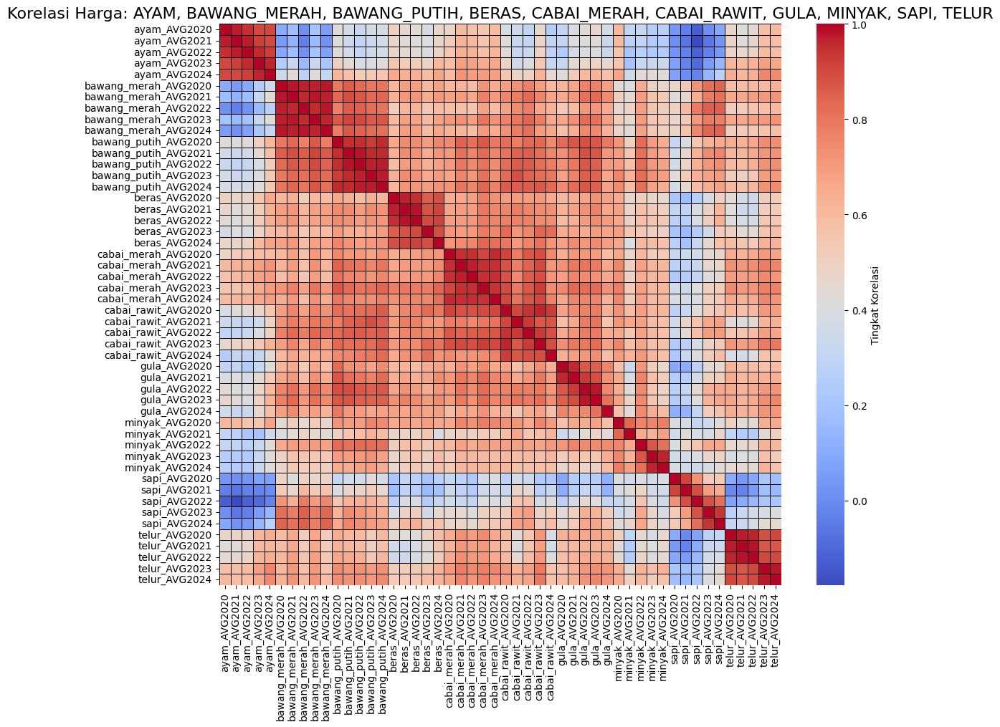

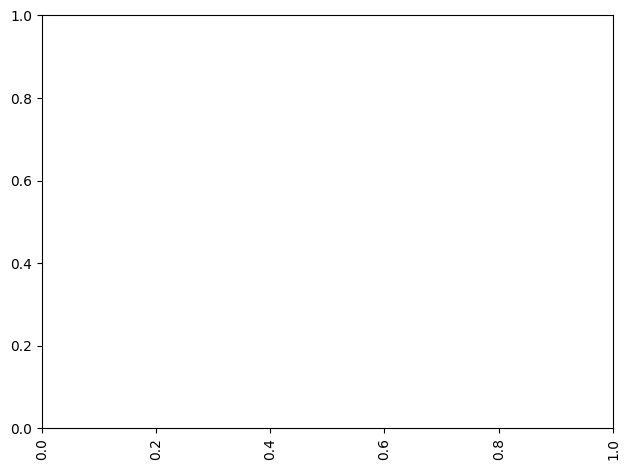

In [33]:
available_commodities = get_available_commodities(df)
print(f"Komoditas Tersedia: {available_commodities}")

cols_to_keep = ['Kabupaten/Kota']
    
for comm in available_commodities:
    # Ambil semua kolom yang berawalan dengan nama komoditas terpilih
    cols_to_keep.extend(get_commodity_columns(df, comm))

# Buat DataFrame hasil filter
df_filtered_corr = df[cols_to_keep].copy()
selected_commodities = ['ayam', 'bawang_merah', 'bawang_putih', 'beras', 'cabai_merah', 'cabai_rawit', 'gula', 'minyak', 'sapi', 'telur']
selected_years = ['2020', '2021', '2022', '2023', '2024']
df_tahunan = aggregate_to_yearly_avg(df_filtered_corr, selected_commodities, selected_years)
print(df_tahunan.head())

# --- LANGKAH 3: VISUALISASI KORELASI ---

# Catatan: Korelasi ini adalah korelasi antara kolom 'ayam_Jan2020' vs 'telur_Feb2020', dll.
plot_correlation_heatmap(
    df_tahunan,
    title=f"Korelasi Harga: {', '.join(available_commodities).upper()}"
)

=== ANGGOTA CLUSTER untuk n_clusters = 2 ===
          Kabupaten/Kota  Cluster
0         Kab. Bulukumba        0
1      Kab. Lombok Timur        0
2            Kab. Majene        0
5   Kab. Polewali Mandar        0
6           Kab. Sumbawa        0
14         Kota Makassar        0
9          Kota Denpasar        0
8              Kota Bima        0
15           Kota Mamuju        0
13           Kota Kupang        0
21         Kota Parepare        0
22        Kota Singaraja        0
20             Kota Palu        0
19           Kota Palopo        0
17          Kota Mataram        0
16           Kota Manado        0
24        Kota Watampone        0
11         Kota Jayapura        1
12          Kota Kendari        1
7           Kota Bau-Bau        1
4           Kab. Merauke        1
3         Kab. Manokwari        1
10        Kota Gorontalo        1
18          Kota Maumere        1
23           Kota Sorong        1


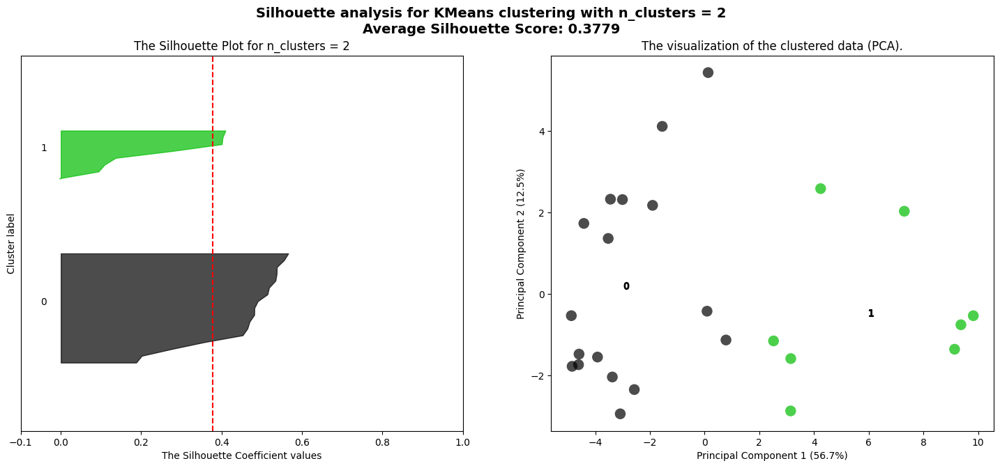

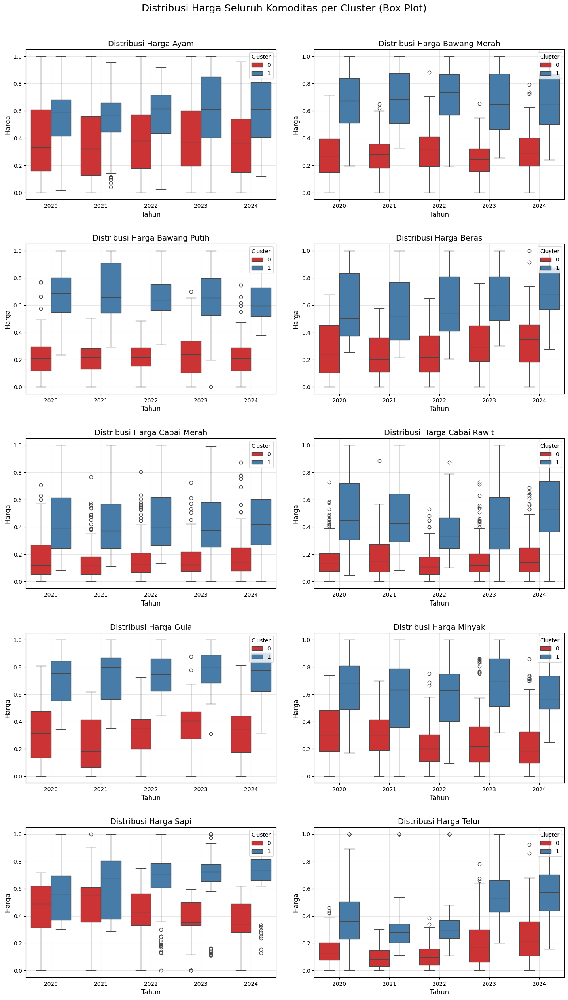

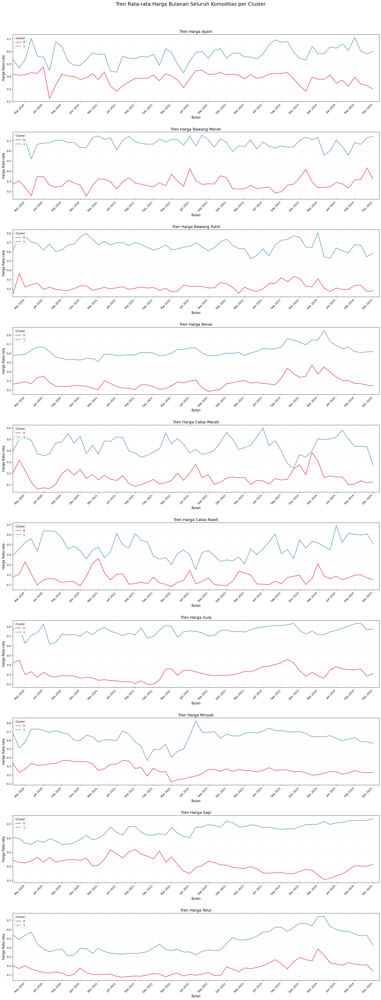

=== ANGGOTA CLUSTER untuk n_clusters = 3 ===
          Kabupaten/Kota  Cluster
0         Kab. Bulukumba        0
1      Kab. Lombok Timur        0
2            Kab. Majene        0
5   Kab. Polewali Mandar        0
6           Kab. Sumbawa        0
14         Kota Makassar        0
9          Kota Denpasar        0
8              Kota Bima        0
15           Kota Mamuju        0
19           Kota Palopo        0
24        Kota Watampone        0
22        Kota Singaraja        0
21         Kota Parepare        0
16           Kota Manado        0
17          Kota Mataram        0
11         Kota Jayapura        1
4           Kab. Merauke        1
3         Kab. Manokwari        1
23           Kota Sorong        1
7           Kota Bau-Bau        2
12          Kota Kendari        2
13           Kota Kupang        2
10        Kota Gorontalo        2
18          Kota Maumere        2
20             Kota Palu        2


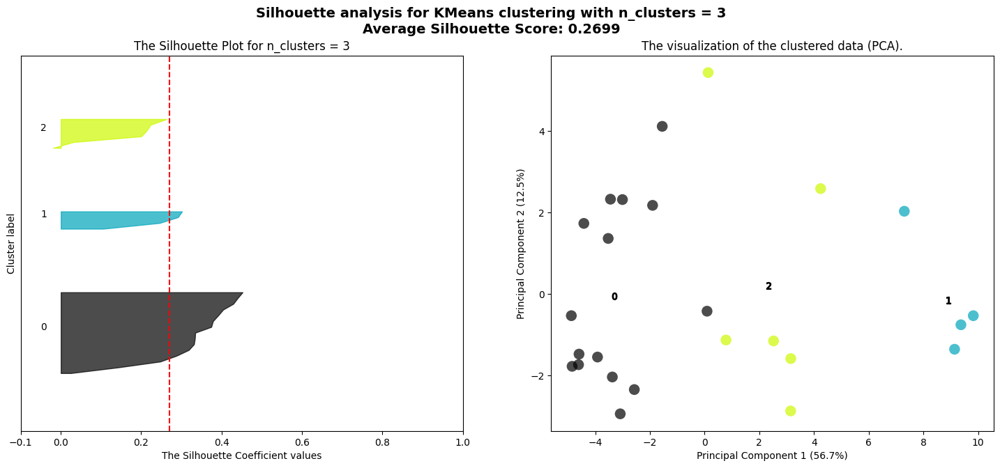

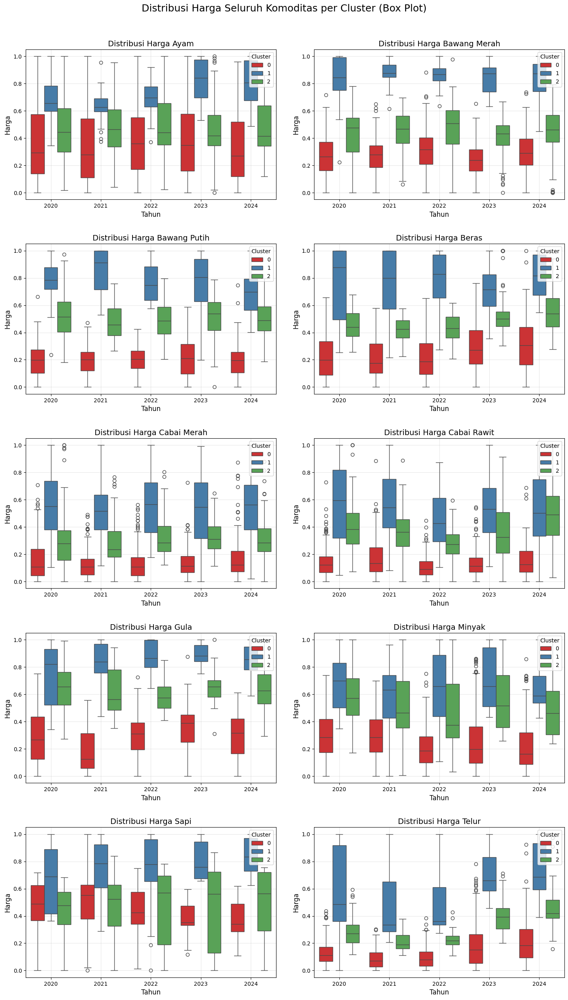

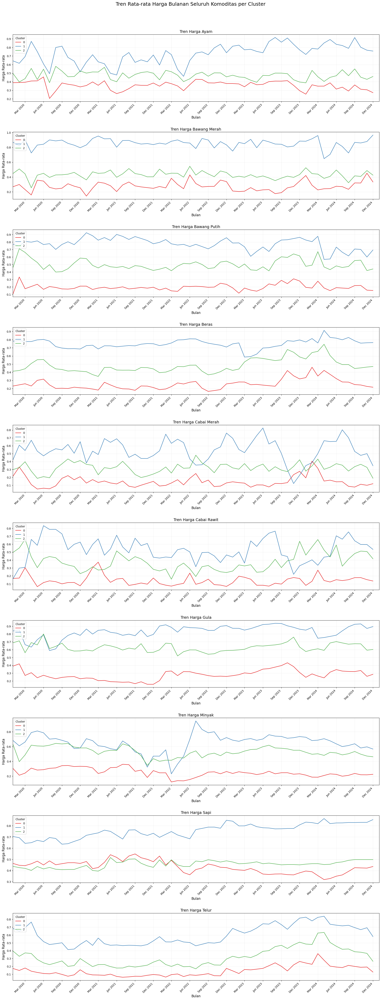

=== ANGGOTA CLUSTER untuk n_clusters = 4 ===
          Kabupaten/Kota  Cluster
0         Kab. Bulukumba        0
1      Kab. Lombok Timur        0
2            Kab. Majene        0
5   Kab. Polewali Mandar        0
15           Kota Mamuju        0
14         Kota Makassar        0
21         Kota Parepare        0
19           Kota Palopo        0
24        Kota Watampone        0
11         Kota Jayapura        1
3         Kab. Manokwari        1
4           Kab. Merauke        1
23           Kota Sorong        1
7           Kota Bau-Bau        2
12          Kota Kendari        2
10        Kota Gorontalo        2
20             Kota Palu        2
18          Kota Maumere        2
16           Kota Manado        2
6           Kab. Sumbawa        3
13           Kota Kupang        3
8              Kota Bima        3
9          Kota Denpasar        3
17          Kota Mataram        3
22        Kota Singaraja        3


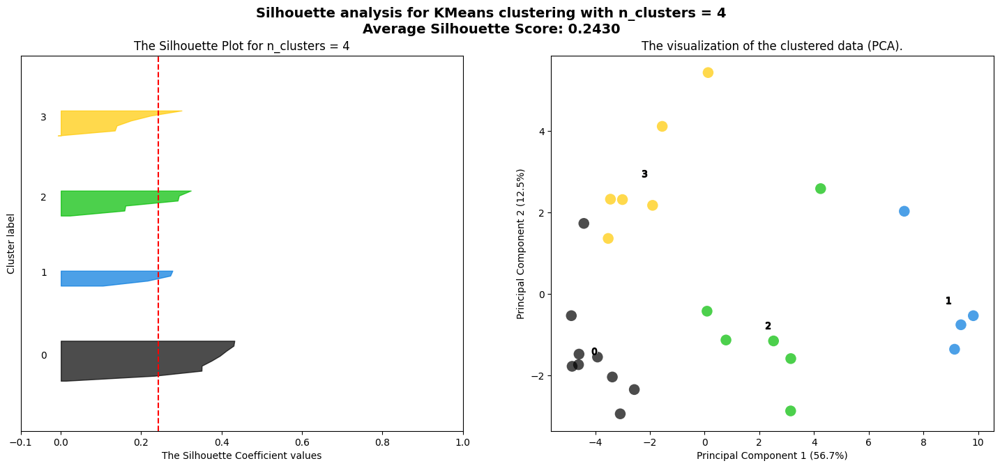

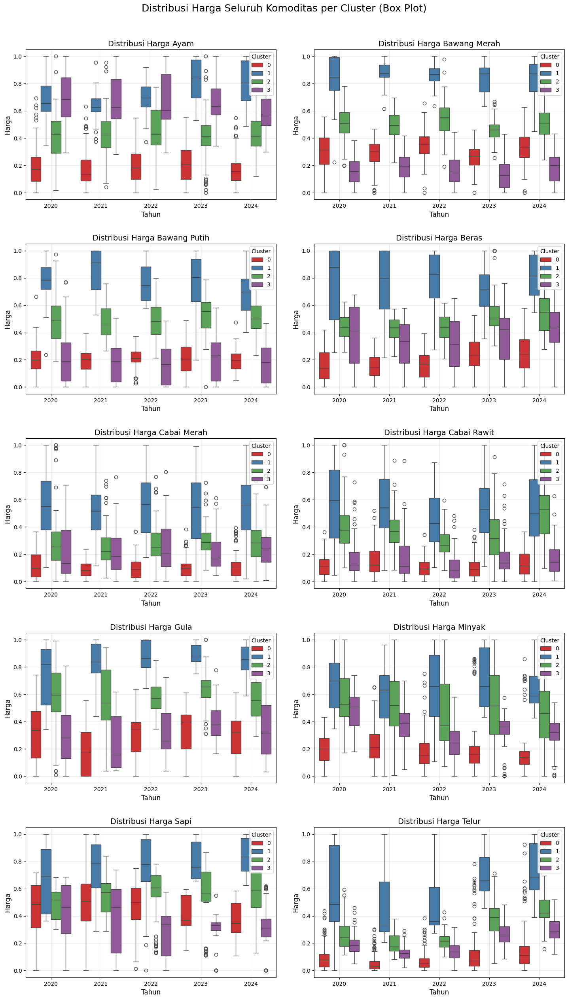

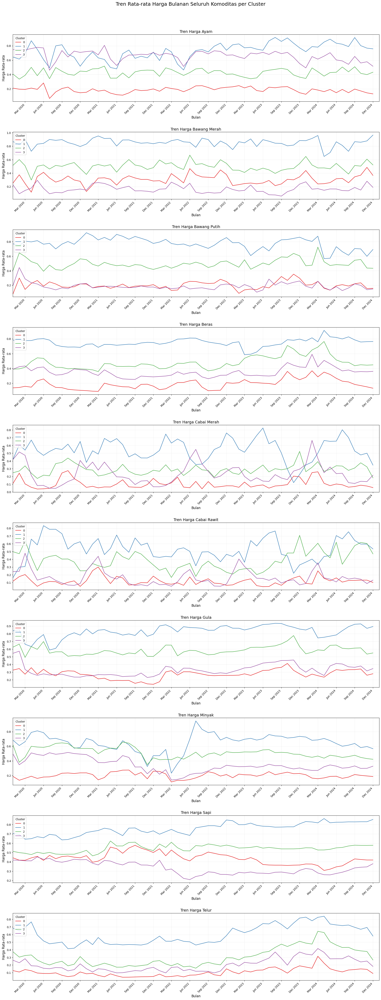

=== ANGGOTA CLUSTER untuk n_clusters = 5 ===
          Kabupaten/Kota  Cluster
4           Kab. Merauke        0
7           Kota Bau-Bau        1
12          Kota Kendari        1
10        Kota Gorontalo        1
18          Kota Maumere        1
20             Kota Palu        1
16           Kota Manado        1
5   Kab. Polewali Mandar        2
15           Kota Mamuju        2
14         Kota Makassar        2
24        Kota Watampone        2
21         Kota Parepare        2
19           Kota Palopo        2
2            Kab. Majene        2
0         Kab. Bulukumba        2
8              Kota Bima        3
6           Kab. Sumbawa        3
1      Kab. Lombok Timur        3
9          Kota Denpasar        3
13           Kota Kupang        3
22        Kota Singaraja        3
17          Kota Mataram        3
11         Kota Jayapura        4
3         Kab. Manokwari        4
23           Kota Sorong        4


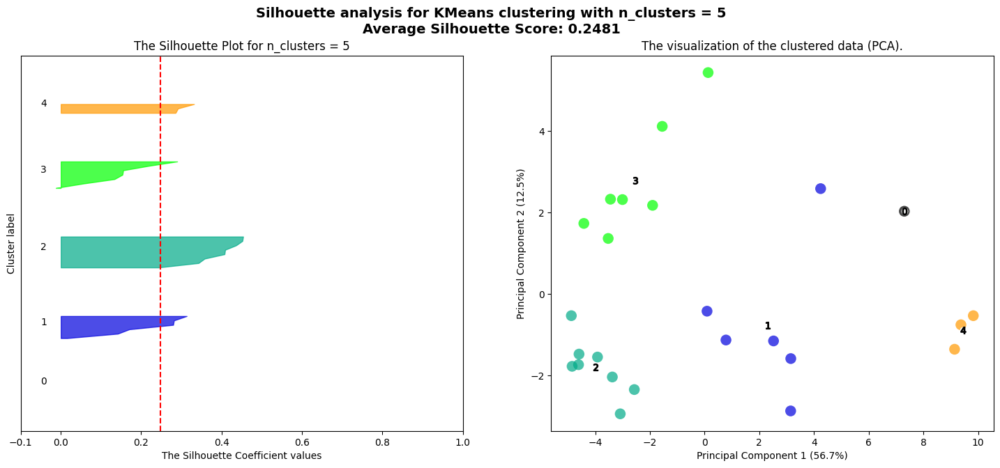

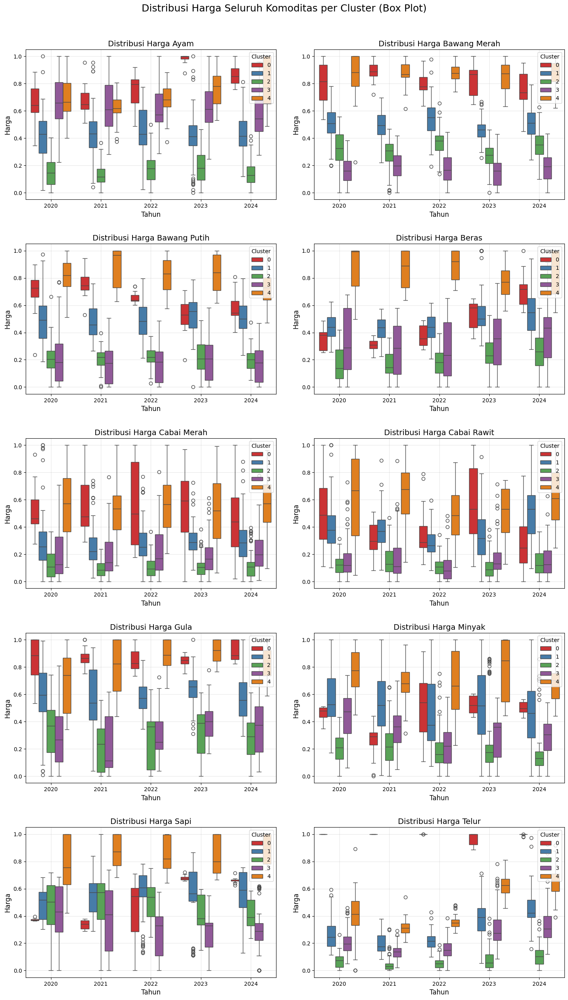

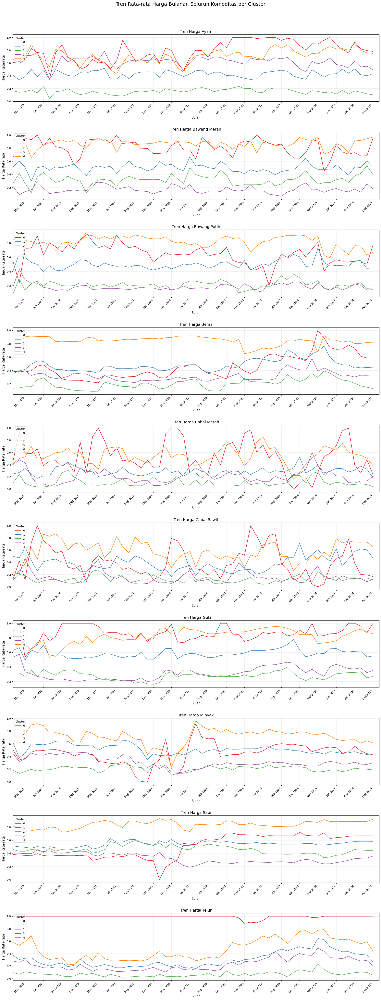

=== ANGGOTA CLUSTER untuk n_clusters = 6 ===
          Kabupaten/Kota  Cluster
3         Kab. Manokwari        0
11         Kota Jayapura        0
23           Kota Sorong        0
2            Kab. Majene        1
15           Kota Mamuju        1
14         Kota Makassar        1
5   Kab. Polewali Mandar        1
0         Kab. Bulukumba        1
24        Kota Watampone        1
21         Kota Parepare        1
19           Kota Palopo        1
22        Kota Singaraja        2
9          Kota Denpasar        2
8              Kota Bima        2
6           Kab. Sumbawa        2
1      Kab. Lombok Timur        2
17          Kota Mataram        2
13           Kota Kupang        3
18          Kota Maumere        3
4           Kab. Merauke        4
12          Kota Kendari        5
10        Kota Gorontalo        5
7           Kota Bau-Bau        5
16           Kota Manado        5
20             Kota Palu        5


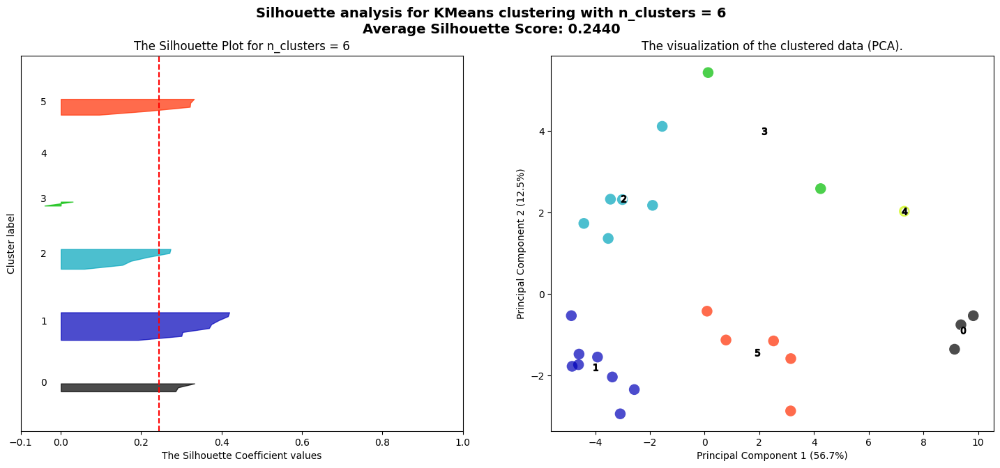

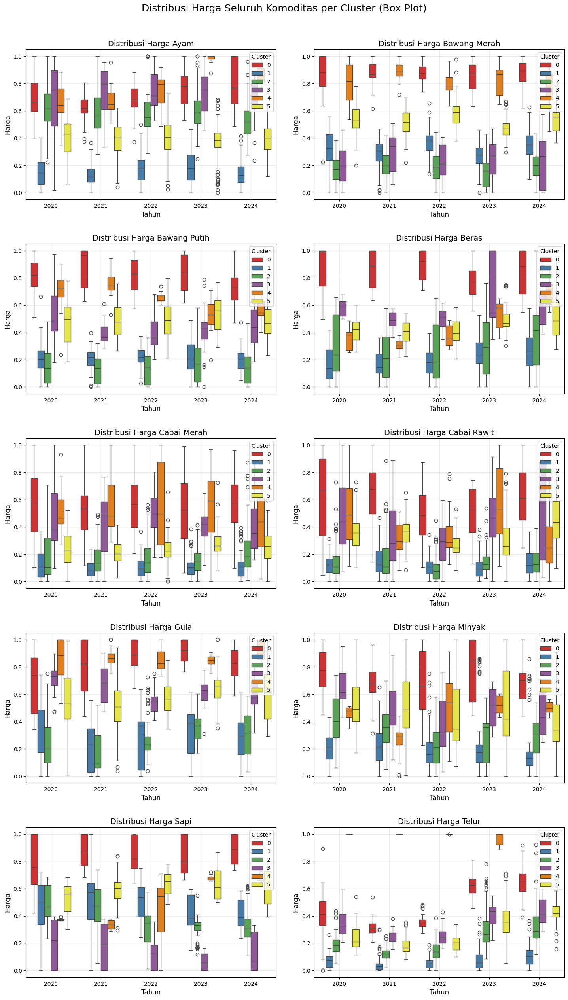

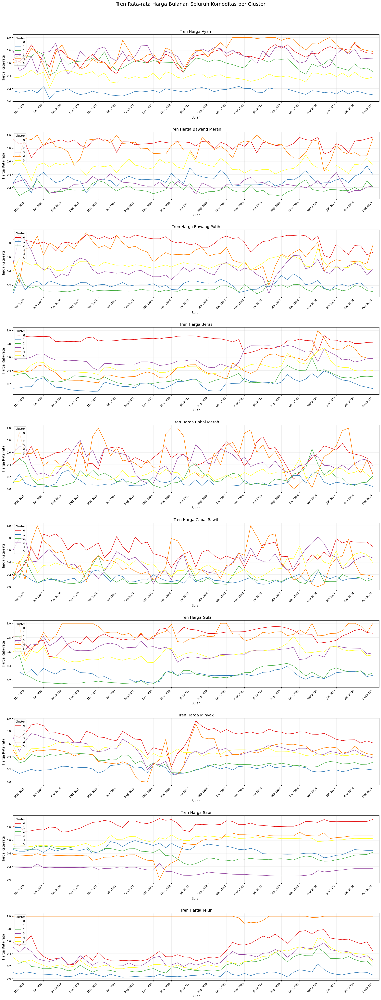

=== ANGGOTA CLUSTER untuk n_clusters = 7 ===
          Kabupaten/Kota  Cluster
0         Kab. Bulukumba        0
2            Kab. Majene        0
5   Kab. Polewali Mandar        0
14         Kota Makassar        0
15           Kota Mamuju        0
24        Kota Watampone        0
21         Kota Parepare        0
19           Kota Palopo        0
18          Kota Maumere        1
8              Kota Bima        2
6           Kab. Sumbawa        2
17          Kota Mataram        2
1      Kab. Lombok Timur        2
3         Kab. Manokwari        3
23           Kota Sorong        3
11         Kota Jayapura        3
9          Kota Denpasar        4
13           Kota Kupang        4
22        Kota Singaraja        4
10        Kota Gorontalo        5
20             Kota Palu        5
12          Kota Kendari        5
7           Kota Bau-Bau        5
16           Kota Manado        5
4           Kab. Merauke        6


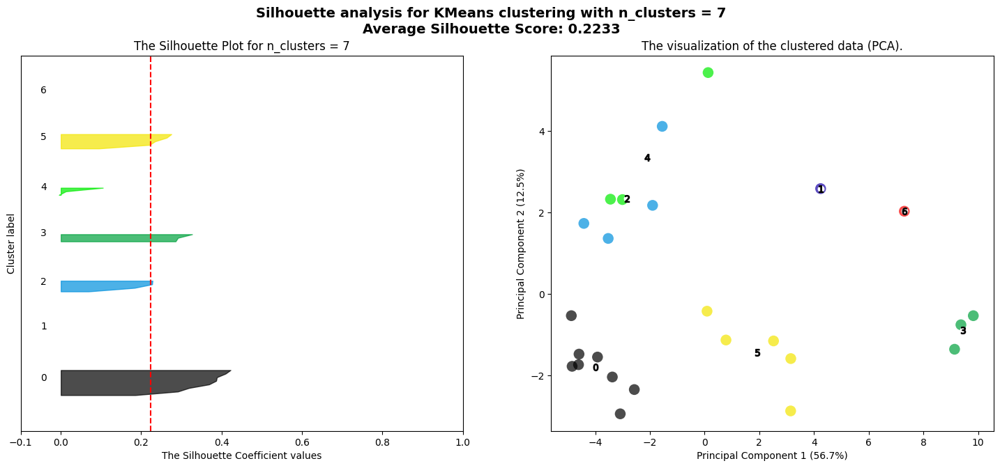

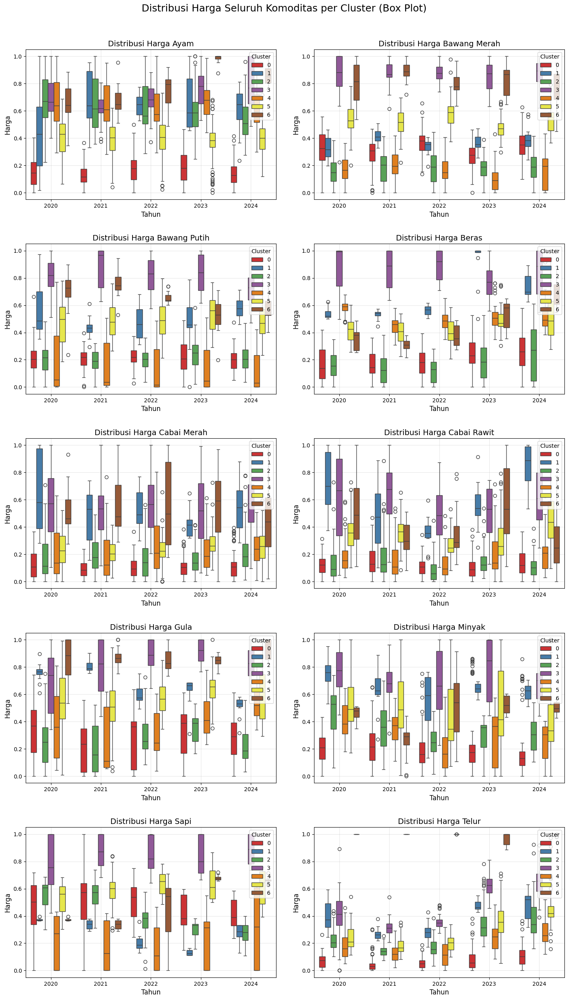

In [ ]:
import time
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples

X = df.drop("Kabupaten/Kota", axis=1)

param_grid = {
    "n_clusters": list(range(2, 11)),  # bisa diperbesar misal range(2, 11)
}
n_init = 10

results = []
visualized_n_clusters = set()
all_clustered_results = []

scaler = MinMaxScaler()
pca = PCA(n_components=2, random_state=42)

X_scaled = scaler.fit_transform(X) # Lakukan scaling pada data fitur
X_pca = pca.fit_transform(X_scaled) # Lakukan PCA pada data yang sudah di-scale
pca_explained_variance = pca.explained_variance_ratio_

df_scaled = pd.DataFrame(
    X_scaled,
    columns=X.columns # Gunakan nama kolom fitur asli (misalnya, ayam_Jan2020)
)

df_scaled.insert(0, 'Kabupaten/Kota', df['Kabupaten/Kota'].values)
df_scaled.to_excel("dataset/hasil_normalisasi.xlsx", index=False)

df_visualized_base = pd.DataFrame(
    X_scaled,
    columns=X.columns # Gunakan nama kolom fitur asli
)
df_visualized_base.insert(0, 'Kabupaten/Kota', df['Kabupaten/Kota'].values)


for n_clusters in param_grid["n_clusters"]:
    if n_clusters not in visualized_n_clusters and n_clusters > 1:
            start_time = time.time()
            model = KMeans(n_clusters=n_clusters, n_init=n_init, random_state=42)
            labels = model.fit_predict(X_scaled)

            if len(set(labels)) > 1:
                sil_score = silhouette_score(X_scaled, labels)
                dbi = davies_bouldin_score(X_scaled, labels)

                sample_silhouette_values = silhouette_samples(X_scaled, labels)

                if n_clusters not in visualized_n_clusters:

                    # label cluster
                    df_clustered = df[['Kabupaten/Kota']].copy()
                    df_clustered['Cluster'] = labels 

                    print(f"=== ANGGOTA CLUSTER untuk n_clusters = {n_clusters} ===")
                    df_clustered_sorted = df_clustered.sort_values(by='Cluster')
                    print(df_clustered_sorted)
                    
                    all_clustered_results.append({
                        "k": n_clusters,
                        "df_cluster": df_clustered.copy() # Gunakan .copy() untuk mencegah referensi data berubah
                    })   

                    centers_pca = pca.transform(model.cluster_centers_) 
                
                    # Panggil fungsi plot
                    plot_silhouette_with_pca(
                        X_scaled, n_clusters, model, sil_score, 
                        sample_silhouette_values, X_pca, centers_pca, pca_explained_variance
                    )

                    df_visualized = df.copy()
                    df_visualized = df_visualized.merge(df_clustered, on="Kabupaten/Kota", how="inner")
                    plot_all_commodities_boxplot(df_visualized)
                    plot_all_commodities_lineplot(df_visualized)

                    visualized_n_clusters.add(n_clusters)

            else:
                sil_score = -1
                dbi = -1

            runtime = time.time() - start_time
        
            # 4. Simpan Hasil
            results.append({
                "n_clusters": n_clusters,
                "n_init": n_init,
                "silhouette": sil_score,
                "dbi": dbi,
                "runtime_sec": runtime
            })

results_df = pd.DataFrame(results)
print(results_df)


MAP

In [9]:
import folium
from IPython.display import display
import pandas as pd
import os

MAP_OUTPUT_DIR = "misc/map/kmeans"

# 💡 PENAMBAHAN BARU: Membuat direktori output jika belum ada
try:
    os.makedirs(MAP_OUTPUT_DIR, exist_ok=True)
    print(f"Folder output '{MAP_OUTPUT_DIR}' sudah siap.")
except Exception as e:
    print(f"Gagal membuat folder: {e}. Periksa izin atau path.")

df_map = pd.read_csv("misc/mapping.csv", delimiter=',')
df_merged = None

for item in all_clustered_results:
    k = item['k']
    df_result = item['df_cluster']
    
    # Menampilkan contoh data dari hasil clustering
    print(f"\n-------------- Hasil Cluster untuk K = {k} --------------------")
    # print(df_result.head())


    # df_merged = df_all.merge(df_result, on="Kabupaten/Kota", how="right")
    # df_merged['Kabupaten/Kota'] = df_merged['Kabupaten/Kota'].str.strip()
    df_merged = df_result.merge(df_map, on="Kabupaten/Kota", how="inner")
    df_merged['Cluster'] = df_merged['Cluster'].astype(str)
    print(df_merged.head(10))

    map = folium.Map(location=[-4.00,130.00], zoom_start=5)

    color_map = {'0': 'blue', '1': 'green', '2': 'red', '-1': 'gray', '3': 'purple', '4': 'orange', '5': 'darkred', '6': 'lightblue', '7': 'beige', '8': 'darkgreen', '9': 'white'}

    for index, row in df_merged.iterrows():
        cluster_label = row['Cluster']

        # print(cluster_label)
        popup_text = f"""
            <b>{row['Kabupaten/Kota']}</b><br>
            Cluster: <b>{cluster_label}</b>
        """

        marker_color = color_map.get(cluster_label, 'black') # Default hitam


        # Pastikan df_map memiliki kolom 'Latitude', 'Longitude', dan 'Kabupaten/Kota'
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            tooltip=row['Kabupaten/Kota'],
            popup=folium.Popup(popup_text, max_width=300), # Gunakan folium.Popup untuk styling
            icon=folium.Icon(color=marker_color) # Tambahkan ikon berwarna
        ).add_to(map)

    file_name = os.path.join(MAP_OUTPUT_DIR, f"peta_cluster_K_{k}.html")
    map.save(file_name) 
    display(map)

    

Folder output 'misc/map/kmeans' sudah siap.

-------------- Hasil Cluster untuk K = 2 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       0     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       0  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       0       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       1          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       1        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       0       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       0  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       1    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       0  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       0                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 3 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       0     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       0  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       0       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       1          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       1        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       0       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       0  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       2    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       0  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       0                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 4 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       0     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       0  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       0       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       1          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       1        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       0       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       3  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       2    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       3  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       3                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 5 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       2     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       3  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       2       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       4          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       0        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       2       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       3  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       1    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       3  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       3                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 6 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       1     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       2  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       1       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       0          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       4        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       1       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       2  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       5    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       2  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       2                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 7 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       0     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       2  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       0       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       3          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       6        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       0       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       2  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       5    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       2  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       4                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 8 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       2     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       6  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       2       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       3          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       4        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       2       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       6  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       1    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       6  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       0                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 9 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       0     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       7  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       0       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       3          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       6        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       0       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       2  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       1    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       2  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       7                 Bali   -8.6556   115.2162



-------------- Hasil Cluster untuk K = 10 --------------------
         Kabupaten/Kota Cluster             Provinsi  Latitude  Longitude
0        Kab. Bulukumba       2     Sulawesi Selatan   -5.3912   120.2559
1     Kab. Lombok Timur       6  Nusa Tenggara Barat   -8.6500   116.5300
2           Kab. Majene       2       Sulawesi Barat   -3.5510   119.0069
3        Kab. Manokwari       8          Papua Barat   -0.8616   134.0622
4          Kab. Merauke       4        Papua Selatan   -8.4716   140.3807
5  Kab. Polewali Mandar       2       Sulawesi Barat   -3.4285   119.3491
6          Kab. Sumbawa       6  Nusa Tenggara Barat   -8.5833   117.3333
7          Kota Bau-Bau       9    Sulawesi Tenggara   -5.4620   122.6288
8             Kota Bima       6  Nusa Tenggara Barat   -8.4770   118.7300
9         Kota Denpasar       0                 Bali   -8.6556   115.2162


EKSTRAK TAHUN

In [12]:
import time
import numpy as np
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples

import pandas as pd

df = pd.read_excel("dataset/preprocessed_gabungan_komoditas.xlsx")
available_years = get_available_years(df.copy())
print(f"\nTahun Tersedia: {available_years}")

selected_years = ['2020', '2021'] 
print(f"Tahun Dipilih: {selected_years}")

df_input = filter_df_by_years(df, selected_years)
print(df_input.head())

X = df_input.drop("Kabupaten/Kota", axis=1)

n_clusters = 2
n_init = 10

results = []
visualized_n_clusters = set()
all_clustered_results = []

scaler = MinMaxScaler()
pca = PCA(n_components=2, random_state=42)

X_scaled = scaler.fit_transform(X) # Lakukan scaling pada data fitur
X_pca = pca.fit_transform(X_scaled) # Lakukan PCA pada data yang sudah di-scale
pca_explained_variance = pca.explained_variance_ratio_

df_visualized_base = pd.DataFrame(
    X_scaled,
    columns=X.columns # Gunakan nama kolom fitur asli
)
df_visualized_base.insert(0, 'Kabupaten/Kota', df['Kabupaten/Kota'].values)


# for n_clusters in param_grid["n_clusters"]:
#     if n_clusters not in visualized_n_clusters and n_clusters > 1:
start_time = time.time()
model = KMeans(n_clusters=n_clusters, n_init=n_init, random_state=42)
labels = model.fit_predict(X_scaled)

if len(set(labels)) > 1:
    sil_score = silhouette_score(X_scaled, labels)
    dbi = davies_bouldin_score(X_scaled, labels)

    sample_silhouette_values = silhouette_samples(X_scaled, labels)

    if n_clusters not in visualized_n_clusters:

        # label cluster
        df_clustered = df[['Kabupaten/Kota']].copy()
        df_clustered['Cluster'] = labels 

        print(f"=== ANGGOTA CLUSTER untuk n_clusters = {n_clusters} ===")
        df_clustered_sorted = df_clustered.sort_values(by='Cluster')
        print(df_clustered_sorted)
        
        all_clustered_results.append({
            "k": n_clusters,
            "df_cluster": df_clustered.copy() # Gunakan .copy() untuk mencegah referensi data berubah
        })   


        # visualized_n_clusters.add(n_clusters)

else:
    sil_score = -1
    dbi = -1

runtime = time.time() - start_time

# 4. Simpan Hasil
results.append({
    "n_clusters": n_clusters,
    "n_init": n_init,
    "silhouette": sil_score,
    "dbi": dbi,
    "runtime_sec": runtime
})

results_df = pd.DataFrame(results)
print(results_df)



Tahun Tersedia: ['2020', '2021', '2022', '2023', '2024']
Tahun Dipilih: ['2020', '2021']
      Kabupaten/Kota  ayam_Jan2020  ayam_Feb2020  ayam_Mar2020  ayam_Apr2020  \
0     Kab. Bulukumba  30413.043478       26275.0  26318.181818  24488.636364   
1  Kab. Lombok Timur  36391.304348       38050.0  33113.636364  27704.545455   
2        Kab. Majene  28478.260870       28125.0  27045.454545  25113.636364   
3     Kab. Manokwari  38754.347826       36840.0  34675.000000  36684.090909   
4       Kab. Merauke  37369.565217       36875.0  36104.545455  36559.090909   

   ayam_May2020  ayam_Jun2020  ayam_Jul2020  ayam_Aug2020  ayam_Sep2020  ...  \
0  25761.904762  33840.909091  31836.956522  26059.523810  25431.818182  ...   
1  36404.761905  40136.363636  35565.217391  25428.571429  32977.272727  ...   
2  27500.000000  27954.545455  29456.521739  27380.952381  27500.000000  ...   
3  39235.714286  47159.090909  53652.173913  47426.190476  41065.909091  ...   
4  38059.523810  38147.727273

In [ ]:
import time
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples

df = pd.read_excel("dataset/hasil_normalisasi_streamlit.xlsx")
print(df.head())

X_scaled = df
##.drop("Kabupaten/Kota", axis=1)

param_grid = {
    "n_clusters": list(range(2, 11)),  # bisa diperbesar misal range(2, 11)
}
n_init = 10

results = []
visualized_n_clusters = set()
all_clustered_results = []

scaler = MinMaxScaler()
pca = PCA(n_components=2, random_state=42)

# X_scaled = scaler.fit_transform(X) # Lakukan scaling pada data fitur
X_pca = pca.fit_transform(X_scaled) # Lakukan PCA pada data yang sudah di-scale
pca_explained_variance = pca.explained_variance_ratio_

# df_scaled = pd.DataFrame(
#     X_scaled,
#     columns=X.columns # Gunakan nama kolom fitur asli (misalnya, ayam_Jan2020)
# )

# df_scaled.insert(0, 'Kabupaten/Kota', df['Kabupaten/Kota'].values)
# df_scaled.to_excel("dataset/hasil_normalisasi.xlsx", index=False)

df_visualized_base = pd.DataFrame(
    X_scaled,
    columns=X.columns # Gunakan nama kolom fitur asli
)
df_visualized_base.insert(0, 'Kabupaten/Kota', df['Kabupaten/Kota'].values)


for n_clusters in param_grid["n_clusters"]:
    if n_clusters not in visualized_n_clusters and n_clusters > 1:
            start_time = time.time()
            model = KMeans(n_clusters=n_clusters, n_init=n_init, random_state=42)
            labels = model.fit_predict(X_scaled)

            if len(set(labels)) > 1:
                sil_score = silhouette_score(X_scaled, labels)
                dbi = davies_bouldin_score(X_scaled, labels)

                sample_silhouette_values = silhouette_samples(X_scaled, labels)

                if n_clusters not in visualized_n_clusters:

                    # label cluster
                    df_clustered = df[['Kabupaten/Kota']].copy()
                    df_clustered['Cluster'] = labels 

                    print(f"=== ANGGOTA CLUSTER untuk n_clusters = {n_clusters} ===")
                    df_clustered_sorted = df_clustered.sort_values(by='Cluster')
                    print(df_clustered_sorted)
                    
                    all_clustered_results.append({
                        "k": n_clusters,
                        "df_cluster": df_clustered.copy() # Gunakan .copy() untuk mencegah referensi data berubah
                    })   

                    centers_pca = pca.transform(model.cluster_centers_) 
                
                    # Panggil fungsi plot
                    plot_silhouette_with_pca(
                        X_scaled, n_clusters, model, sil_score, 
                        sample_silhouette_values, X_pca, centers_pca, pca_explained_variance
                    )

                    df_visualized = df.copy()
                    df_visualized = df_visualized.merge(df_clustered, on="Kabupaten/Kota", how="inner")
                    plot_all_commodities_boxplot(df_visualized)
                    plot_all_commodities_lineplot(df_visualized)

                    visualized_n_clusters.add(n_clusters)

            else:
                sil_score = -1
                dbi = -1

            runtime = time.time() - start_time
        
            # 4. Simpan Hasil
            results.append({
                "n_clusters": n_clusters,
                "n_init": n_init,
                "silhouette": sil_score,
                "dbi": dbi,
                "runtime_sec": runtime
            })

results_df = pd.DataFrame(results)
print(results_df)

      Kabupaten/Kota  ayam_Jan2020  ayam_Feb2020  ayam_Mar2020  ayam_Apr2020  \
0     Kab. Bulukumba      0.361341      0.229899      0.260456      0.331311   
1  Kab. Lombok Timur      0.572360      0.639749      0.528810      0.463369   
2        Kab. Majene      0.293048      0.294292      0.289176      0.356976   
3     Kab. Manokwari      0.655770      0.597633      0.590468      0.832105   
4       Kab. Merauke      0.606891      0.598851      0.646922      0.826972   

   ayam_May2020  ayam_Jun2020  ayam_Jul2020  ayam_Aug2020  ayam_Sep2020  ...  \
0      0.243216      0.402669      0.134060      0.244231      0.239028  ...   
1      0.692462      0.620094      0.248105      0.221913      0.551705  ...   
2      0.316583      0.199372      0.061245      0.290972      0.324732  ...   
3      0.811960      0.862637      0.801370      1.000000      0.886890  ...   
4      0.762312      0.551413      0.345857      0.765959      0.884159  ...   

   telur_Mar2024  telur_Apr2024  telur